This notebook is used to study the dataset and test the behaviour of the feature extractor so as to build prototypical embeddings

# SETUP

In [1]:
import os
import sys
import torch
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import torchvision.transforms as T

sys.path.append(os.path.abspath(".."))
import original_modules.gsenn
import original_modules.aggregators
import original_modules.parametrizers
import original_modules.conceptizers_BDD
from bdd_models.template_model import RCNN_global
from original_modules.gsenn import GSENN

from argparse import Namespace
from data_modules.dataset import load_data

In [2]:
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

sys.modules['models'] = original_modules.gsenn
sys.modules['conceptizers_BDD'] = original_modules.conceptizers_BDD
sys.modules['aggregators'] = original_modules.aggregators
sys.modules['parametrizers'] = original_modules.parametrizers

args = Namespace(
    batch_size=2,
)

# UTILS

In [3]:
def plot_training_images(images, class_labels, attr_labels, num_images=10):
    fig, axes = plt.subplots(num_images, 1, figsize=(10, 10 * num_images))
    if num_images == 1: axes = [axes]
    for i in range(num_images):
        img = images[i].permute(1, 2, 0).numpy()
        axes[i].imshow(img)
        axes[i].axis('off')
        class_label = class_labels[i].item() if class_labels.ndim == 1 else class_labels[i]
        attr_label = attr_labels[i].numpy() if isinstance(attr_labels[i], torch.Tensor) else attr_labels[i]
        axes[i].set_title(f"Class Label: {class_label}\nAttr Labels: {attr_label}")
    plt.tight_layout()
    plt.show()

# Function to plot ROIs on the image with confidence filtering
def plot_rois(image, rois, labels, scores, confidence_threshold=0.9):
    # Convert the image tensor to a NumPy array for visualization
    image_np = image.permute(1, 2, 0).cpu().numpy()

    # Create a plot
    fig, ax = plt.subplots(1, figsize=(12, 8))
    ax.imshow(image_np)

    # Plot each ROI with confidence > threshold
    for i, box in enumerate(rois):
        if scores[i].item() > confidence_threshold:  # Filter by confidence
            x1, y1, x2, y2 = box.cpu().numpy()
            rect = patches.Rectangle((x1, y1), x2 - x1, y2 - y1, linewidth=2, edgecolor='r', facecolor='none')
            ax.add_patch(rect)

            # Add label and score as text
            label = labels[i].item()
            score = scores[i].item()
            ax.text(x1, y1 - 5, f"Label: {label}, Score: {score:.2f}", color='white', fontsize=10, bbox=dict(facecolor='red', alpha=0.5))

    plt.show()

# DATA

In [4]:
# load dataset
train_data_path = "../data/train_BDD_OIA_test.pkl"
val_data_path = "../data/val_BDD_OIA_test.pkl"
test_data_path = "../data/test_BDD_OIA_test.pkl"    

# load_data. Detail is BDD/dataset.py, lines 149-. This function is made by CBM's authors
train_loader = load_data([train_data_path], True, False, args.batch_size, uncertain_label=False, n_class_attr=2, image_dir="images", resampling=False)
valid_loader = load_data([val_data_path], True, False, args.batch_size, uncertain_label=False, n_class_attr=2, image_dir="images", resampling=False)
test_loader = load_data([test_data_path], True, False, args.batch_size, uncertain_label=False, n_class_attr=2, image_dir="images", resampling=False)    

# Check the number of training samples
num_training_samples = len(train_loader.dataset)
print(f"Number of training samples: {num_training_samples}")

Number of training samples: 16082


# EXTRACTOR

In [5]:
pretrained_model = RCNN_global()
checkpoint = torch.load('../bdd_models/model_weight.pt')
pretrained_model.load_state_dict(checkpoint['pretrained'])
pretrained_model = pretrained_model.to('cuda')
pretrained_model.eval()
print("Pretrained model loaded successfully.")

/users-1/eleonora/anaconda3/envs/r4rr/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/users-1/eleonora/anaconda3/envs/r4rr/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Total parameters in global feature extractor: 6793408
Pretrained model loaded successfully.


# Inspect samples and ROIs for specified attribute classes

In [6]:
def show_images_with_attribute(train_loader, extractor, attribute_index, num_images=5, confidence_threshold=0.9, plot=False):
    """
    - train_loader: yields (images, class_labels, attr_labels, img_paths)
    - extractor: your RCNN_global instance
    - attribute_index: which of the 21 attributes to filter on
    - num_images: how many to show
    """
    found = 0
    
    for images, class_labels, attr_labels, img_paths in train_loader:
        images = images.to('cuda')
        # attr_labels is (B,21); select those with the bit already = 1
        mask = attr_labels[:, attribute_index] == 1
        indices = mask.nonzero(as_tuple=True)[0]
        if len(indices) == 0:
            continue

        for i in indices:
            # grab the i-th sample
            img = images[i]             # [3, H, W]
            path = img_paths[i]         # string path

            print(f"\n=== Sample #{found+1}  —  path: {path} ===")
            print(class_labels[i].cpu().numpy())
            print(f"Original attr_labels: {attr_labels[i].cpu().numpy()}")
            
            # extract ROIs (we assume extractor returns x, rois, scores, labels, box_feats)
            with torch.no_grad():
                scene_feats, scene_feats_raw, rois, scores, labels, bbox_feats, _ = extractor(img.unsqueeze(0))
                print("global feature shape:", scene_feats.shape)
                print("rois shape:", rois.shape)
                print("scores shape:", scores.shape)
                print("labels shape:", labels.shape)
                print("bbox_feats shape:", bbox_feats.shape)

            # plot the rois on the image
            if plot:    
                print("Plotting ROIs on the image...")
                plot_rois(img, rois[:,1:], labels, scores, confidence_threshold=confidence_threshold)

            print(bbox_feats[0])
            num_zeros = (bbox_feats[0] == 0).sum().item()
            print(f"Number of 0 entries in bbox_feats: {num_zeros}")
            print(scene_feats)
            num_zeros = (scene_feats == 0).sum().item()
            print(f"Number of 0 entries in scene_feats: {num_zeros}")
            num_zeros = (scene_feats_raw == 0).sum().item()
            print(f"Number of 0 entries in scene_feats_raw: {num_zeros}")
            
            found += 1
            if found >= num_images:
                return

    if found == 0:
        print(f"No samples found with attribute index {attribute_index} == 1.")


=== Sample #1  —  path: ../data/BDD/data/b5a407d5-c2abd312_1.jpg ===
[1. 0. 0. 1. 0.]
Original attr_labels: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 0. 1. 0. 0. 1. 0.]
global feature shape: torch.Size([1, 2048])
rois shape: torch.Size([80, 5])
scores shape: torch.Size([80])
labels shape: torch.Size([80])
bbox_feats shape: torch.Size([80, 1024])
Plotting ROIs on the image...


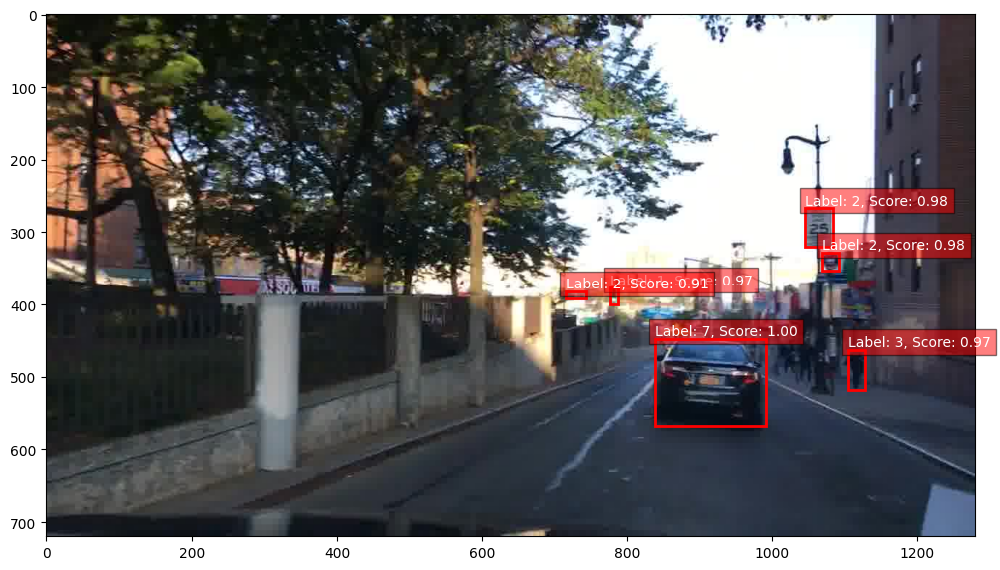

tensor([-0.2008,  0.6772, -0.1390,  ...,  0.3394, -0.3640,  0.1906],
       device='cuda:0')
Number of 0 entries in bbox_feats: 0
tensor([[1.8757, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],
       device='cuda:0')
Number of 0 entries in scene_feats: 1931
Number of 0 entries in scene_feats_raw: 0

=== Sample #2  —  path: ../data/BDD/data/8dd58869-2738b69a_1.jpg ===
[1. 0. 0. 1. 0.]
Original attr_labels: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
global feature shape: torch.Size([1, 2048])
rois shape: torch.Size([66, 5])
scores shape: torch.Size([66])
labels shape: torch.Size([66])
bbox_feats shape: torch.Size([66, 1024])
Plotting ROIs on the image...


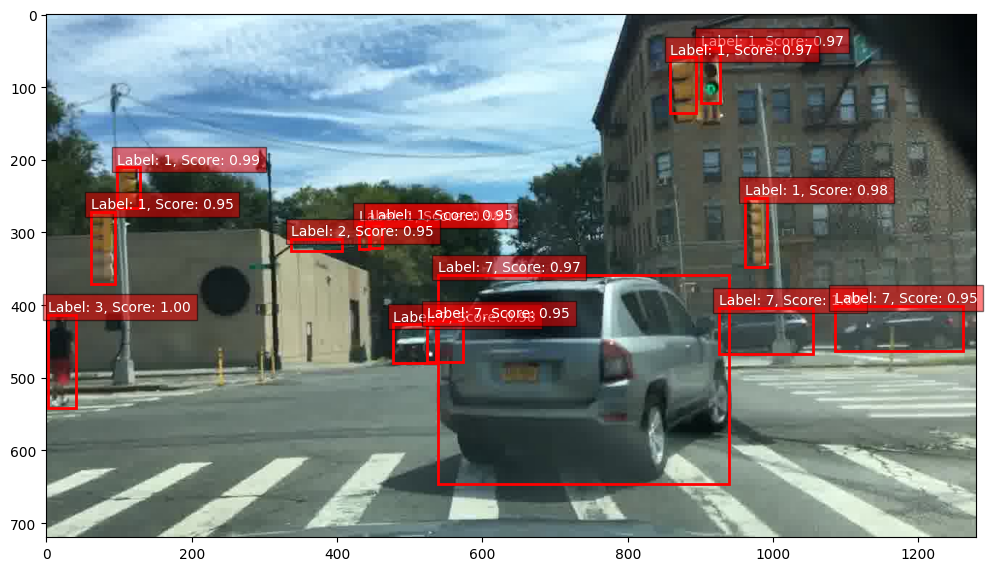

tensor([-0.1971,  0.8358, -0.2133,  ...,  0.2557, -0.9123,  0.4299],
       device='cuda:0')
Number of 0 entries in bbox_feats: 0
tensor([[0., 0., 0.,  ..., 0., 0., 0.]], device='cuda:0')
Number of 0 entries in scene_feats: 1951
Number of 0 entries in scene_feats_raw: 0

=== Sample #3  —  path: ../data/BDD/data/575a2c21-3ee40a12_1.jpg ===
[1. 0. 0. 1. 0.]
Original attr_labels: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.]
global feature shape: torch.Size([1, 2048])
rois shape: torch.Size([49, 5])
scores shape: torch.Size([49])
labels shape: torch.Size([49])
bbox_feats shape: torch.Size([49, 1024])
Plotting ROIs on the image...


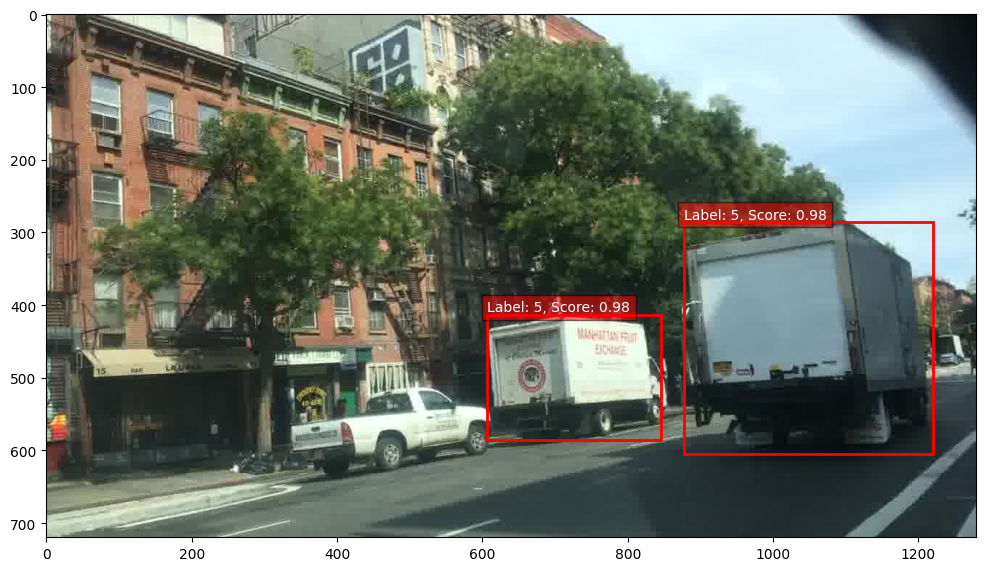

tensor([-0.0878,  0.6606,  0.5367,  ...,  0.1538,  0.0771,  0.1660],
       device='cuda:0')
Number of 0 entries in bbox_feats: 0
tensor([[0.0000, 0.2164, 4.4684,  ..., 0.0000, 0.0000, 0.0000]],
       device='cuda:0')
Number of 0 entries in scene_feats: 1877
Number of 0 entries in scene_feats_raw: 0

=== Sample #4  —  path: ../data/BDD/data/4ae517b9-28192873_3.jpg ===
[1. 0. 1. 1. 0.]
Original attr_labels: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 1. 0.]
global feature shape: torch.Size([1, 2048])
rois shape: torch.Size([70, 5])
scores shape: torch.Size([70])
labels shape: torch.Size([70])
bbox_feats shape: torch.Size([70, 1024])
Plotting ROIs on the image...


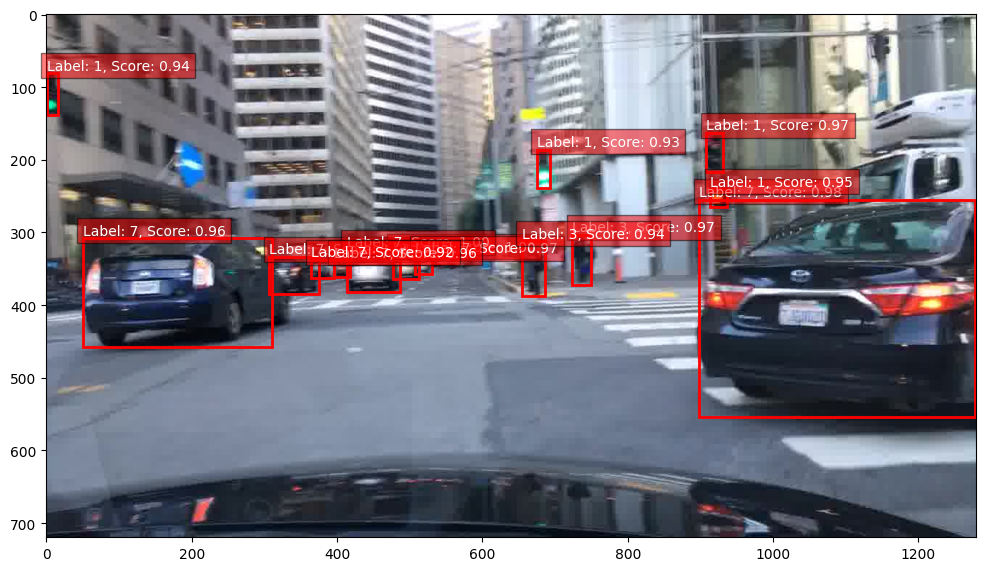

tensor([ 0.0970,  0.6847, -0.1901,  ...,  0.1689, -0.4494,  0.1671],
       device='cuda:0')
Number of 0 entries in bbox_feats: 0
tensor([[0., 0., 0.,  ..., 0., 0., 0.]], device='cuda:0')
Number of 0 entries in scene_feats: 1937
Number of 0 entries in scene_feats_raw: 0

=== Sample #5  —  path: ../data/BDD/data/9b0581c4-dd55e5ac_1.jpg ===
[1. 0. 0. 1. 0.]
Original attr_labels: [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.]
global feature shape: torch.Size([1, 2048])
rois shape: torch.Size([67, 5])
scores shape: torch.Size([67])
labels shape: torch.Size([67])
bbox_feats shape: torch.Size([67, 1024])
Plotting ROIs on the image...


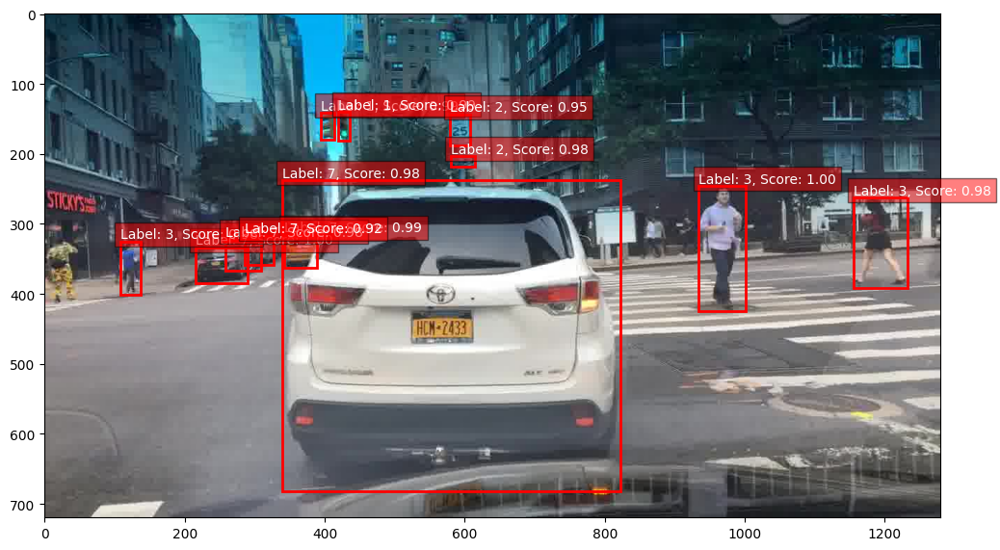

tensor([ 0.0446,  0.4526, -0.0690,  ...,  0.2230, -0.3351,  0.3029],
       device='cuda:0')
Number of 0 entries in bbox_feats: 0
tensor([[0., 0., 0.,  ..., 0., 0., 0.]], device='cuda:0')
Number of 0 entries in scene_feats: 1951
Number of 0 entries in scene_feats_raw: 0

=== Sample #6  —  path: ../data/BDD/data/1e3dcb86-1a791f34_1.jpg ===
[1. 0. 0. 1. 0.]
Original attr_labels: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
global feature shape: torch.Size([1, 2048])
rois shape: torch.Size([85, 5])
scores shape: torch.Size([85])
labels shape: torch.Size([85])
bbox_feats shape: torch.Size([85, 1024])
Plotting ROIs on the image...


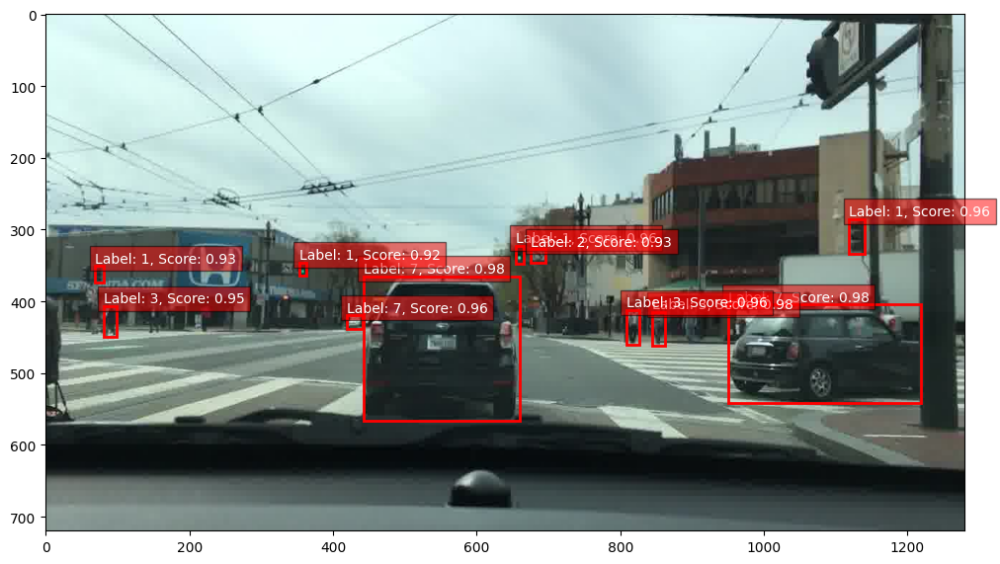

tensor([-0.0503,  0.5566, -0.1361,  ...,  0.0613, -0.4001,  0.1898],
       device='cuda:0')
Number of 0 entries in bbox_feats: 0
tensor([[0., 0., 0.,  ..., 0., 0., 0.]], device='cuda:0')
Number of 0 entries in scene_feats: 1924
Number of 0 entries in scene_feats_raw: 0

=== Sample #7  —  path: ../data/BDD/data/a0be3324-76212eb8_3.jpg ===
[1. 0. 0. 1. 0.]
Original attr_labels: [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.]
global feature shape: torch.Size([1, 2048])
rois shape: torch.Size([76, 5])
scores shape: torch.Size([76])
labels shape: torch.Size([76])
bbox_feats shape: torch.Size([76, 1024])
Plotting ROIs on the image...


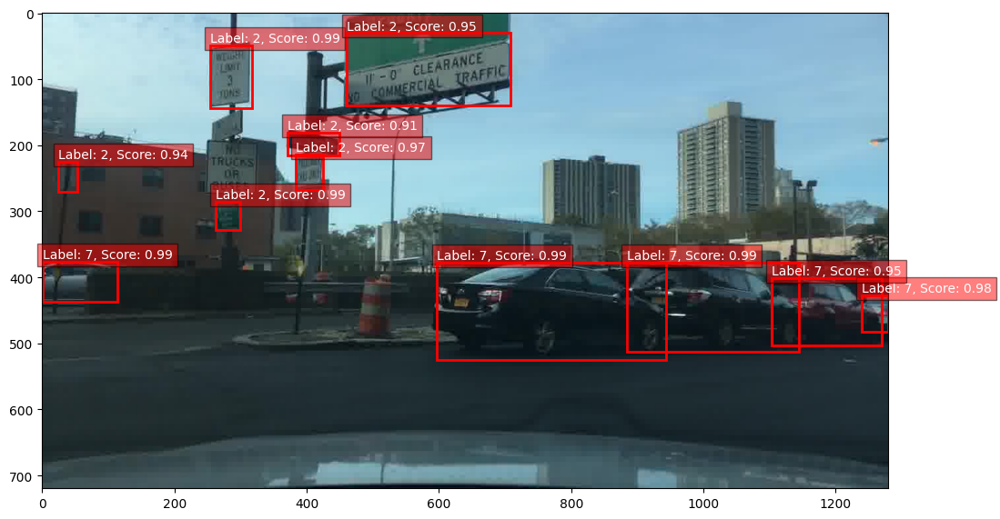

tensor([ 0.1588,  0.7363, -0.1380,  ...,  0.4108,  0.0351,  0.2506],
       device='cuda:0')
Number of 0 entries in bbox_feats: 0
tensor([[0., 0., 0.,  ..., 0., 0., 0.]], device='cuda:0')
Number of 0 entries in scene_feats: 1876
Number of 0 entries in scene_feats_raw: 0

=== Sample #8  —  path: ../data/BDD/data/55fdb5bd-a8b60076_1.jpg ===
[0. 0. 0. 1. 0.]
Original attr_labels: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
global feature shape: torch.Size([1, 2048])
rois shape: torch.Size([72, 5])
scores shape: torch.Size([72])
labels shape: torch.Size([72])
bbox_feats shape: torch.Size([72, 1024])
Plotting ROIs on the image...


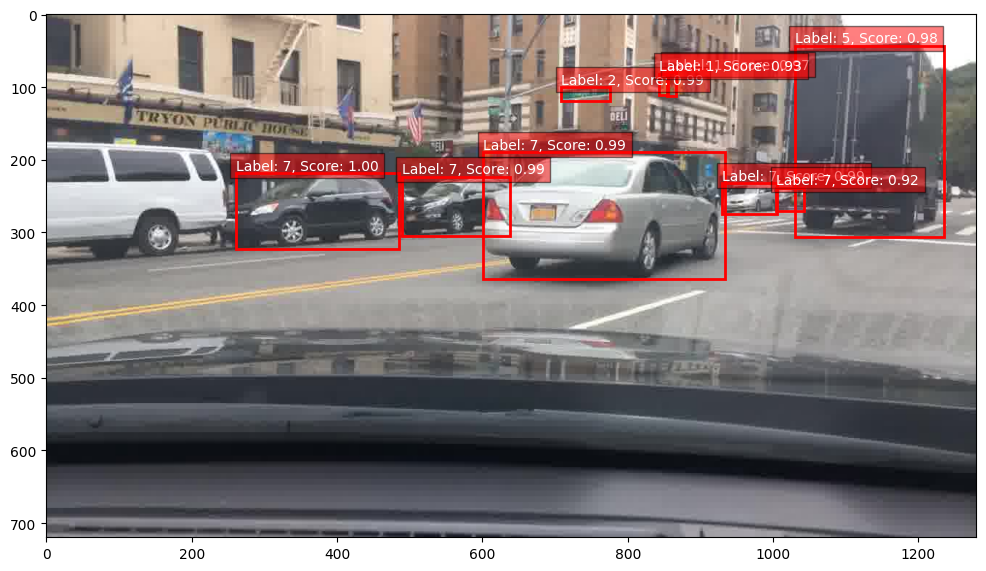

tensor([-0.0582,  0.5765, -0.0693,  ...,  0.2109, -0.5100,  0.1821],
       device='cuda:0')
Number of 0 entries in bbox_feats: 0
tensor([[0., 0., 0.,  ..., 0., 0., 0.]], device='cuda:0')
Number of 0 entries in scene_feats: 1898
Number of 0 entries in scene_feats_raw: 0

=== Sample #9  —  path: ../data/BDD/data/94be2873-f11dc587_3.jpg ===
[1. 0. 0. 1. 0.]
Original attr_labels: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 1. 0. 0. 0. 0. 0.]
global feature shape: torch.Size([1, 2048])
rois shape: torch.Size([100, 5])
scores shape: torch.Size([100])
labels shape: torch.Size([100])
bbox_feats shape: torch.Size([100, 1024])
Plotting ROIs on the image...


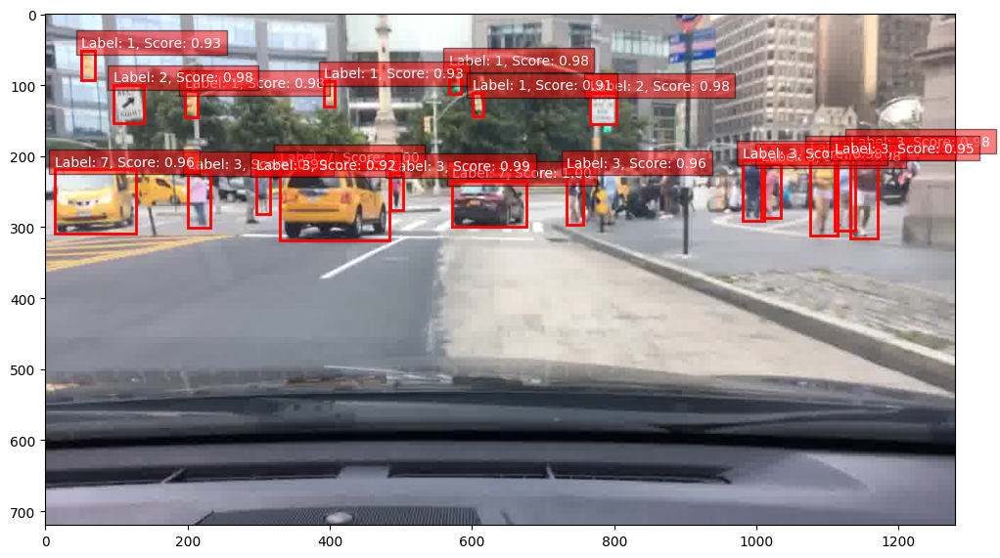

tensor([-0.0623,  0.4486, -0.1995,  ...,  0.2581, -0.6790,  0.2142],
       device='cuda:0')
Number of 0 entries in bbox_feats: 0
tensor([[0.0000, 0.0433, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],
       device='cuda:0')
Number of 0 entries in scene_feats: 1946
Number of 0 entries in scene_feats_raw: 0

=== Sample #10  —  path: ../data/BDD/data/c0f35000-9401b8f3_1.jpg ===
[1. 0. 0. 1. 1.]
Original attr_labels: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.]
global feature shape: torch.Size([1, 2048])
rois shape: torch.Size([100, 5])
scores shape: torch.Size([100])
labels shape: torch.Size([100])
bbox_feats shape: torch.Size([100, 1024])
Plotting ROIs on the image...


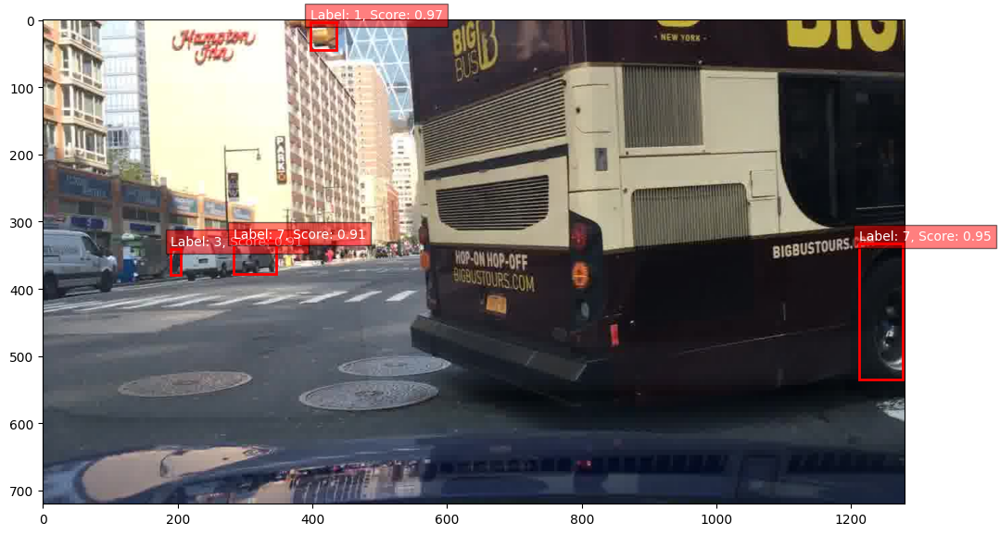

tensor([ 0.0696,  0.8668,  0.0918,  ..., -0.0260,  0.3976, -0.0839],
       device='cuda:0')
Number of 0 entries in bbox_feats: 0
tensor([[0., 0., 0.,  ..., 0., 0., 0.]], device='cuda:0')
Number of 0 entries in scene_feats: 1958
Number of 0 entries in scene_feats_raw: 0

=== Sample #11  —  path: ../data/BDD/data/b803d91d-17b149ce_3.jpg ===
[1. 0. 1. 1. 0.]
Original attr_labels: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 1. 0. 0.]
global feature shape: torch.Size([1, 2048])
rois shape: torch.Size([95, 5])
scores shape: torch.Size([95])
labels shape: torch.Size([95])
bbox_feats shape: torch.Size([95, 1024])
Plotting ROIs on the image...


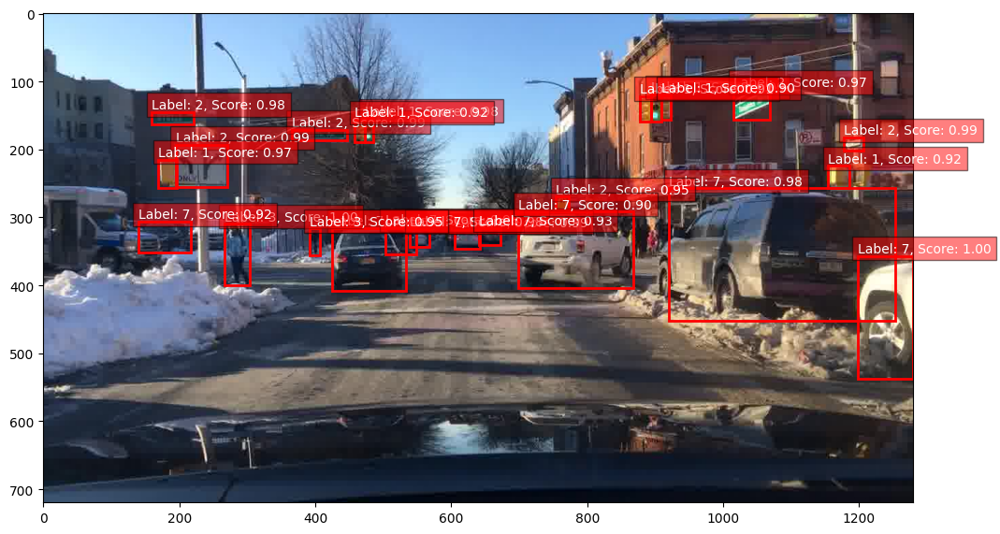

tensor([-0.1269,  0.5790, -0.2380,  ...,  0.1436, -0.5683,  0.0880],
       device='cuda:0')
Number of 0 entries in bbox_feats: 0
tensor([[0., 0., 0.,  ..., 0., 0., 0.]], device='cuda:0')
Number of 0 entries in scene_feats: 1929
Number of 0 entries in scene_feats_raw: 0

=== Sample #12  —  path: ../data/BDD/data/21ad4431-8cda5882_1.jpg ===
[1. 0. 1. 1. 0.]
Original attr_labels: [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 0. 0. 0. 1. 0. 0.]
global feature shape: torch.Size([1, 2048])
rois shape: torch.Size([92, 5])
scores shape: torch.Size([92])
labels shape: torch.Size([92])
bbox_feats shape: torch.Size([92, 1024])
Plotting ROIs on the image...


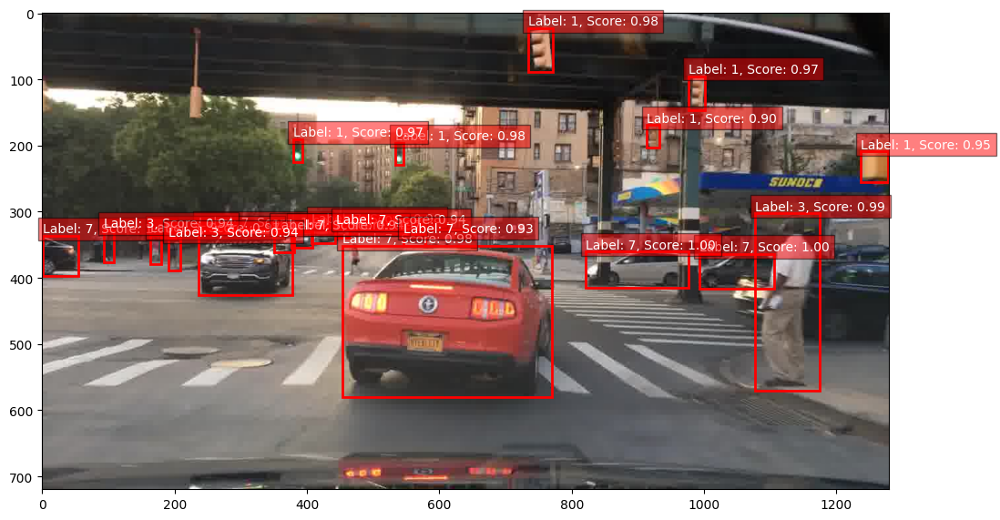

tensor([-0.1625,  0.7025, -0.0427,  ...,  0.1368, -0.4604,  0.1813],
       device='cuda:0')
Number of 0 entries in bbox_feats: 0
tensor([[0., 0., 0.,  ..., 0., 0., 0.]], device='cuda:0')
Number of 0 entries in scene_feats: 1957
Number of 0 entries in scene_feats_raw: 0

=== Sample #13  —  path: ../data/BDD/data/c6921a51-1735be44_3.jpg ===
[1. 0. 1. 1. 0.]
Original attr_labels: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0.]
global feature shape: torch.Size([1, 2048])
rois shape: torch.Size([100, 5])
scores shape: torch.Size([100])
labels shape: torch.Size([100])
bbox_feats shape: torch.Size([100, 1024])
Plotting ROIs on the image...


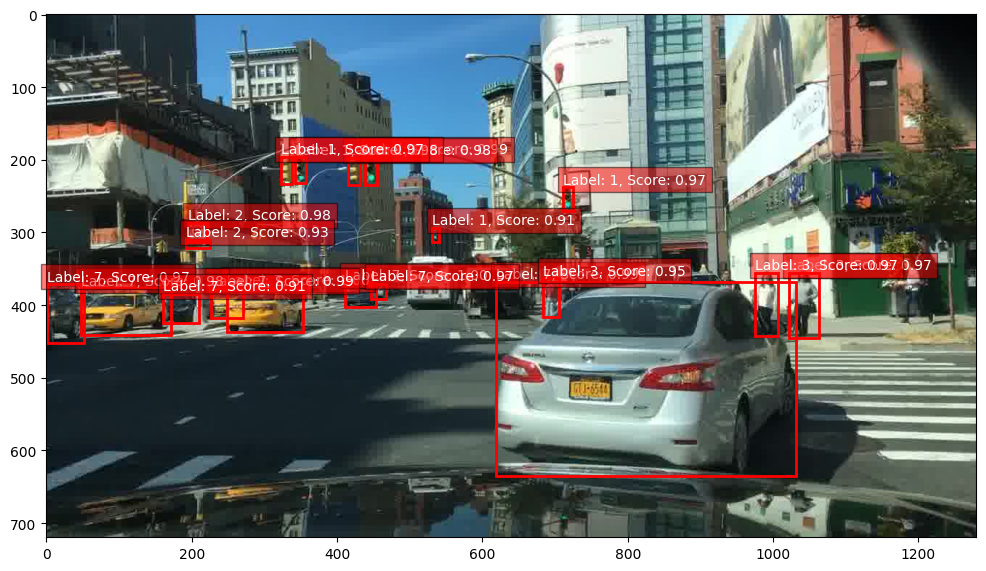

tensor([ 0.0261,  0.4666, -0.0512,  ...,  0.2669, -0.6208,  0.2077],
       device='cuda:0')
Number of 0 entries in bbox_feats: 0
tensor([[0.0000, 0.3643, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],
       device='cuda:0')
Number of 0 entries in scene_feats: 1951
Number of 0 entries in scene_feats_raw: 0

=== Sample #14  —  path: ../data/BDD/data/3286411b-83d59894_1.jpg ===
[1. 0. 0. 1. 0.]
Original attr_labels: [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 1. 0. 0. 1. 0.]
global feature shape: torch.Size([1, 2048])
rois shape: torch.Size([72, 5])
scores shape: torch.Size([72])
labels shape: torch.Size([72])
bbox_feats shape: torch.Size([72, 1024])
Plotting ROIs on the image...


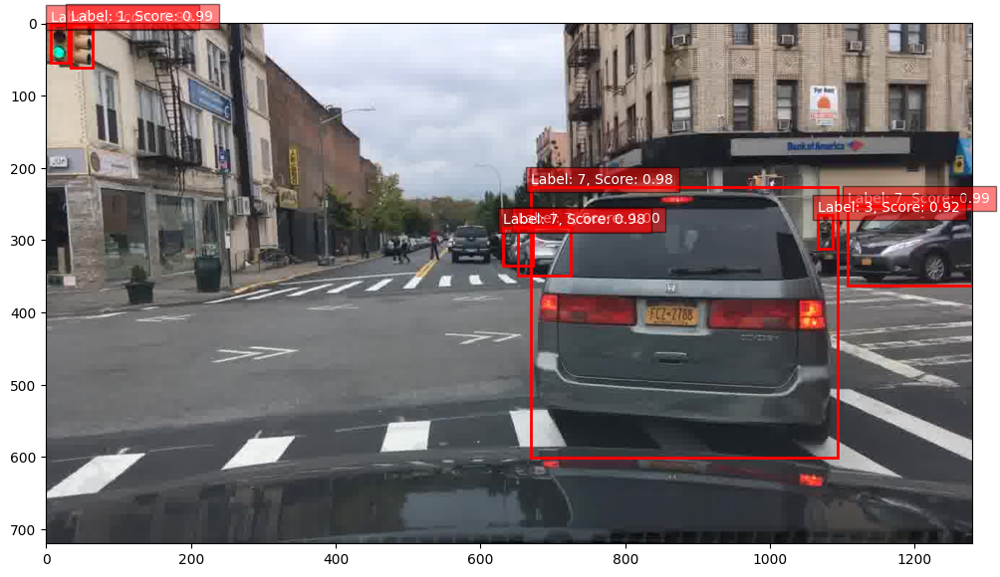

tensor([-0.0854,  0.5846, -0.2782,  ...,  0.0036, -0.3033, -0.0264],
       device='cuda:0')
Number of 0 entries in bbox_feats: 0
tensor([[0., 0., 0.,  ..., 0., 0., 0.]], device='cuda:0')
Number of 0 entries in scene_feats: 1938
Number of 0 entries in scene_feats_raw: 0

=== Sample #15  —  path: ../data/BDD/data/b251064f-8d92db81_1.jpg ===
[1. 0. 0. 1. 0.]
Original attr_labels: [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 1. 0. 0. 1. 0.]
global feature shape: torch.Size([1, 2048])
rois shape: torch.Size([91, 5])
scores shape: torch.Size([91])
labels shape: torch.Size([91])
bbox_feats shape: torch.Size([91, 1024])
Plotting ROIs on the image...


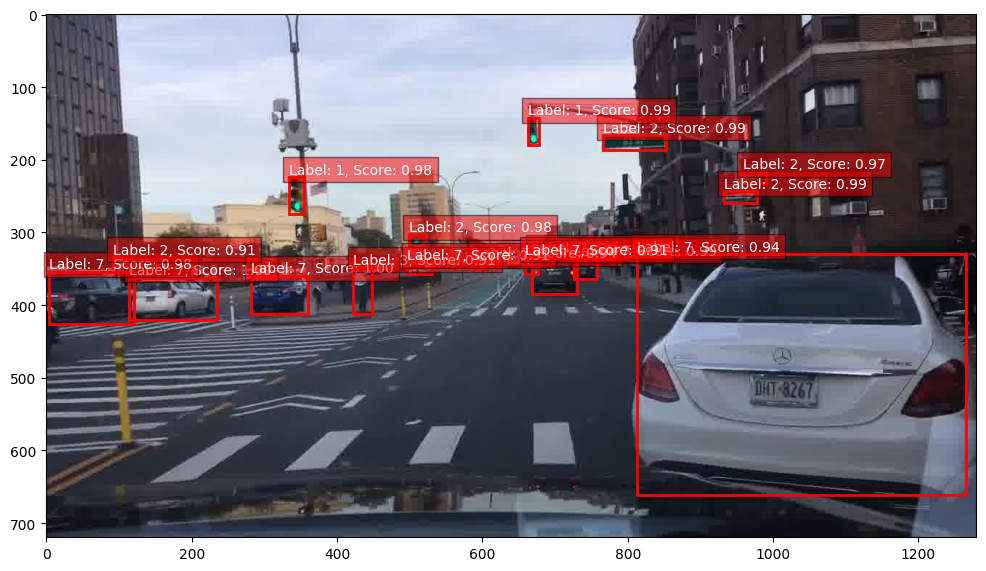

tensor([-0.2732,  0.6744, -0.1535,  ...,  0.1947, -0.5343,  0.0046],
       device='cuda:0')
Number of 0 entries in bbox_feats: 0
tensor([[0., 0., 0.,  ..., 0., 0., 0.]], device='cuda:0')
Number of 0 entries in scene_feats: 1925
Number of 0 entries in scene_feats_raw: 0

=== Sample #16  —  path: ../data/BDD/data/25a85673-54c28966_1.jpg ===
[0. 0. 1. 1. 0.]
Original attr_labels: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 0. 0. 0. 0. 1. 0.]
global feature shape: torch.Size([1, 2048])
rois shape: torch.Size([89, 5])
scores shape: torch.Size([89])
labels shape: torch.Size([89])
bbox_feats shape: torch.Size([89, 1024])
Plotting ROIs on the image...


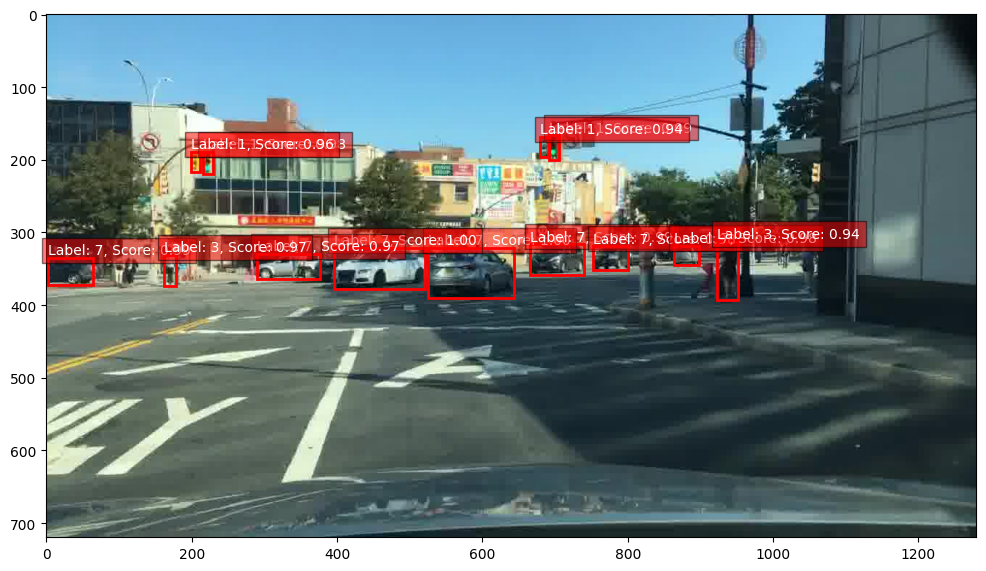

tensor([-0.0370,  0.5056, -0.2386,  ...,  0.1673, -0.5501,  0.0504],
       device='cuda:0')
Number of 0 entries in bbox_feats: 0
tensor([[0., 0., 0.,  ..., 0., 0., 0.]], device='cuda:0')
Number of 0 entries in scene_feats: 1945
Number of 0 entries in scene_feats_raw: 0

=== Sample #17  —  path: ../data/BDD/data/22cd38a4-f41aef10_1.jpg ===
[1. 0. 1. 1. 0.]
Original attr_labels: [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 1. 0.]
global feature shape: torch.Size([1, 2048])
rois shape: torch.Size([100, 5])
scores shape: torch.Size([100])
labels shape: torch.Size([100])
bbox_feats shape: torch.Size([100, 1024])
Plotting ROIs on the image...


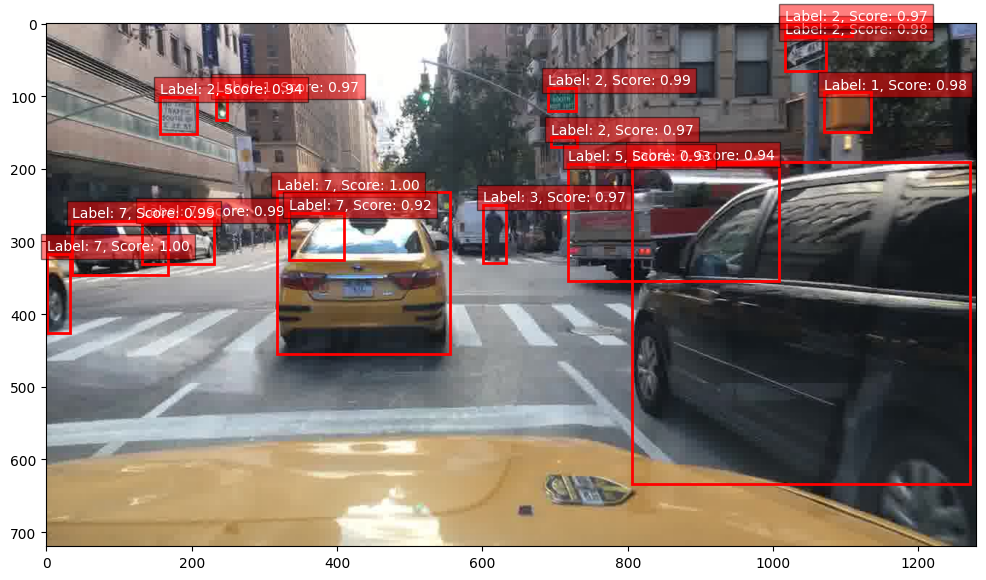

tensor([-0.0190,  0.9349, -0.1322,  ...,  0.8442, -0.7791,  0.2199],
       device='cuda:0')
Number of 0 entries in bbox_feats: 0
tensor([[0., 0., 0.,  ..., 0., 0., 0.]], device='cuda:0')
Number of 0 entries in scene_feats: 1966
Number of 0 entries in scene_feats_raw: 0

=== Sample #18  —  path: ../data/BDD/data/adfc8f5c-b1f02e04_1.jpg ===
[0. 0. 0. 1. 0.]
Original attr_labels: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 1. 0. 0. 0. 0. 0.]
global feature shape: torch.Size([1, 2048])
rois shape: torch.Size([72, 5])
scores shape: torch.Size([72])
labels shape: torch.Size([72])
bbox_feats shape: torch.Size([72, 1024])
Plotting ROIs on the image...


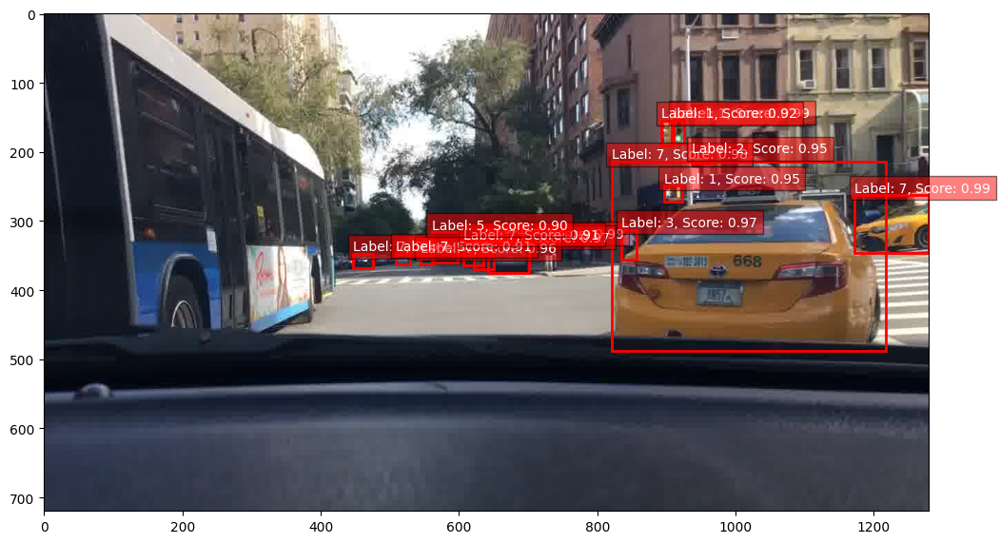

tensor([ 0.2951,  0.5819,  0.2127,  ..., -0.0741, -0.0855,  0.4237],
       device='cuda:0')
Number of 0 entries in bbox_feats: 0
tensor([[0., 0., 0.,  ..., 0., 0., 0.]], device='cuda:0')
Number of 0 entries in scene_feats: 1924
Number of 0 entries in scene_feats_raw: 0

=== Sample #19  —  path: ../data/BDD/data/661281ca-5030a165_1.jpg ===
[1. 0. 0. 1. 0.]
Original attr_labels: [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 0. 0. 0. 0. 0. 0.]
global feature shape: torch.Size([1, 2048])
rois shape: torch.Size([100, 5])
scores shape: torch.Size([100])
labels shape: torch.Size([100])
bbox_feats shape: torch.Size([100, 1024])
Plotting ROIs on the image...


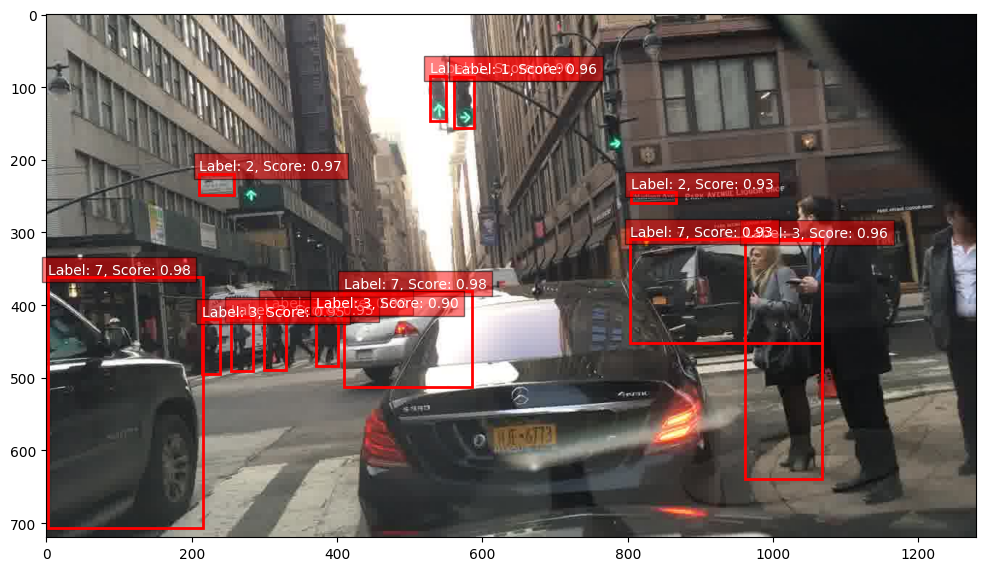

tensor([ 0.0762,  0.6005,  0.3127,  ...,  0.1632, -0.1999,  0.2925],
       device='cuda:0')
Number of 0 entries in bbox_feats: 0
tensor([[0., 0., 0.,  ..., 0., 0., 0.]], device='cuda:0')
Number of 0 entries in scene_feats: 1982
Number of 0 entries in scene_feats_raw: 0

=== Sample #20  —  path: ../data/BDD/data/04df85b9-23db975c_3.jpg ===
[1. 0. 1. 1. 0.]
Original attr_labels: [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0.]
global feature shape: torch.Size([1, 2048])
rois shape: torch.Size([65, 5])
scores shape: torch.Size([65])
labels shape: torch.Size([65])
bbox_feats shape: torch.Size([65, 1024])
Plotting ROIs on the image...


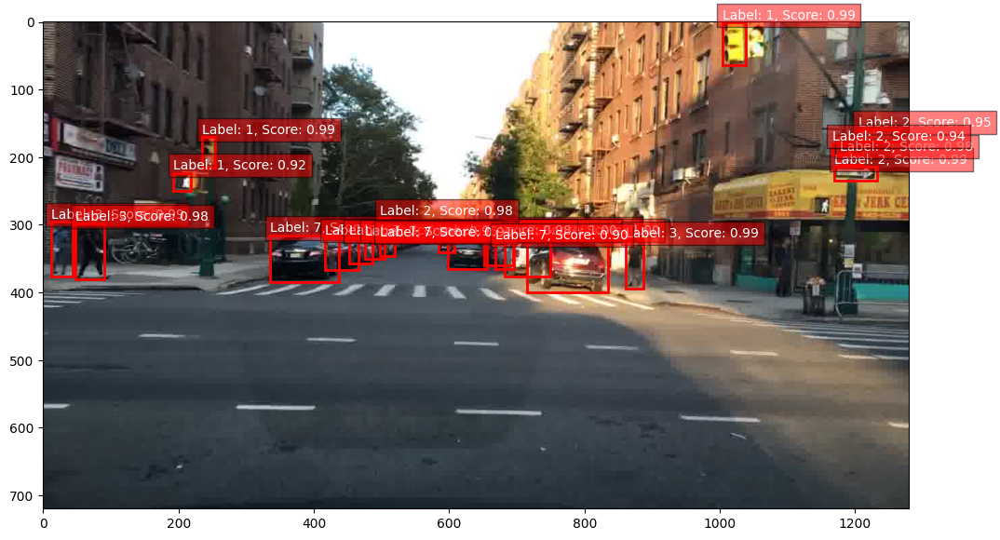

tensor([-0.0469,  0.6033, -0.1731,  ...,  0.1717, -0.7381,  0.0746],
       device='cuda:0')
Number of 0 entries in bbox_feats: 0
tensor([[0., 0., 0.,  ..., 0., 0., 0.]], device='cuda:0')
Number of 0 entries in scene_feats: 1916
Number of 0 entries in scene_feats_raw: 0

=== Sample #21  —  path: ../data/BDD/data/3a6b8e59-99426fe0_1.jpg ===
[1. 0. 0. 1. 0.]
Original attr_labels: [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.]
global feature shape: torch.Size([1, 2048])
rois shape: torch.Size([68, 5])
scores shape: torch.Size([68])
labels shape: torch.Size([68])
bbox_feats shape: torch.Size([68, 1024])
Plotting ROIs on the image...


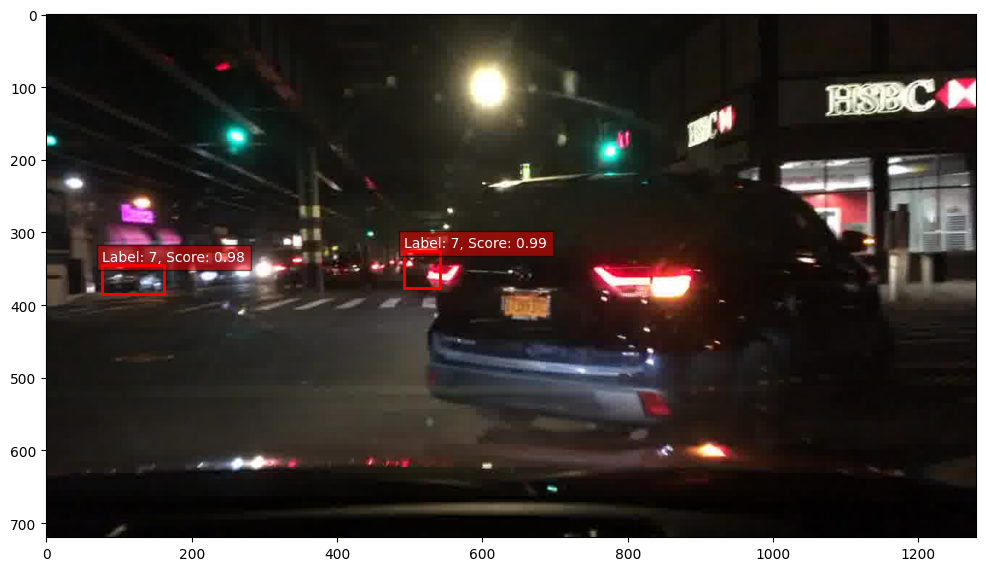

tensor([ 0.0044,  0.6034, -0.2557,  ...,  0.0804,  0.0026,  0.0039],
       device='cuda:0')
Number of 0 entries in bbox_feats: 0
tensor([[0., 0., 0.,  ..., 0., 0., 0.]], device='cuda:0')
Number of 0 entries in scene_feats: 1951
Number of 0 entries in scene_feats_raw: 0

=== Sample #22  —  path: ../data/BDD/data/c2d33423-8f1d3d05_3.jpg ===
[1. 0. 0. 1. 0.]
Original attr_labels: [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.]
global feature shape: torch.Size([1, 2048])
rois shape: torch.Size([59, 5])
scores shape: torch.Size([59])
labels shape: torch.Size([59])
bbox_feats shape: torch.Size([59, 1024])
Plotting ROIs on the image...


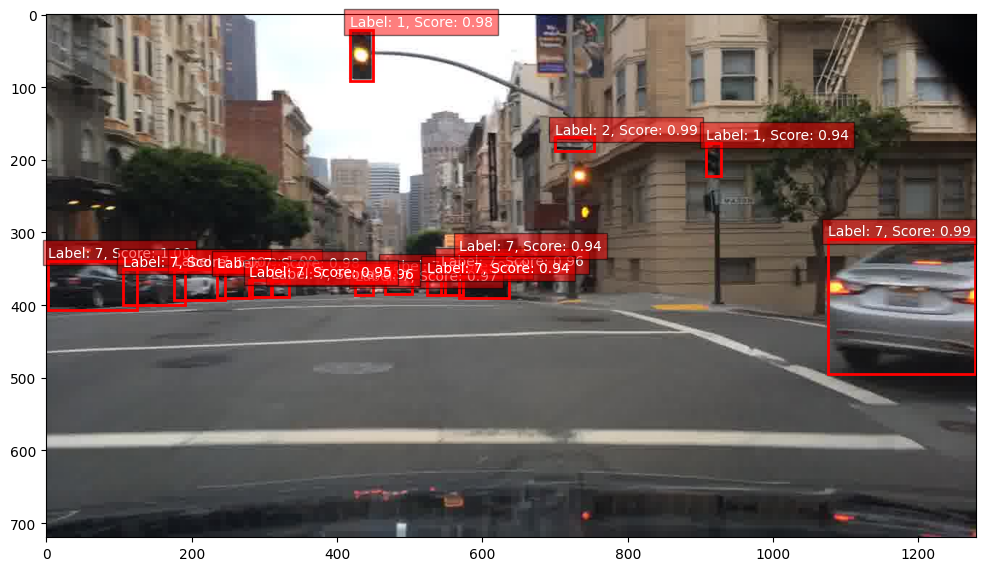

tensor([ 0.0254,  0.6399, -0.2215,  ..., -0.0089, -0.4699,  0.0890],
       device='cuda:0')
Number of 0 entries in bbox_feats: 0
tensor([[0., 0., 0.,  ..., 0., 0., 0.]], device='cuda:0')
Number of 0 entries in scene_feats: 1914
Number of 0 entries in scene_feats_raw: 0

=== Sample #23  —  path: ../data/BDD/data/3d631a17-172b2b6c_3.jpg ===
[0. 1. 1. 1. 0.]
Original attr_labels: [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0.]
global feature shape: torch.Size([1, 2048])
rois shape: torch.Size([73, 5])
scores shape: torch.Size([73])
labels shape: torch.Size([73])
bbox_feats shape: torch.Size([73, 1024])
Plotting ROIs on the image...


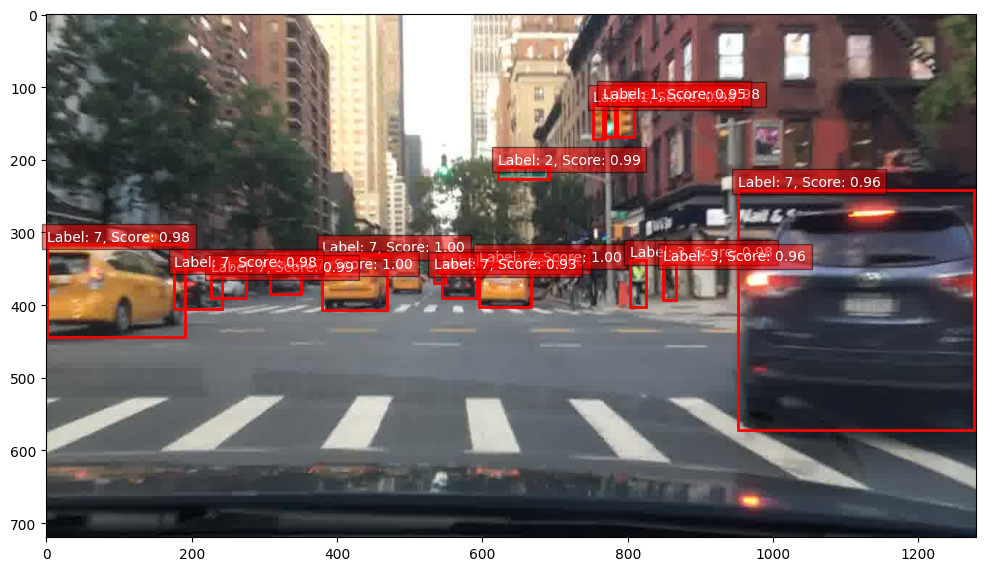

tensor([-0.0352,  0.6707, -0.0365,  ...,  0.2046, -0.3550,  0.1601],
       device='cuda:0')
Number of 0 entries in bbox_feats: 0
tensor([[0., 0., 0.,  ..., 0., 0., 0.]], device='cuda:0')
Number of 0 entries in scene_feats: 1929
Number of 0 entries in scene_feats_raw: 0

=== Sample #24  —  path: ../data/BDD/data/3edb2cb8-ccb5ca6c_3.jpg ===
[1. 0. 0. 1. 0.]
Original attr_labels: [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 1. 0.]
global feature shape: torch.Size([1, 2048])
rois shape: torch.Size([81, 5])
scores shape: torch.Size([81])
labels shape: torch.Size([81])
bbox_feats shape: torch.Size([81, 1024])
Plotting ROIs on the image...


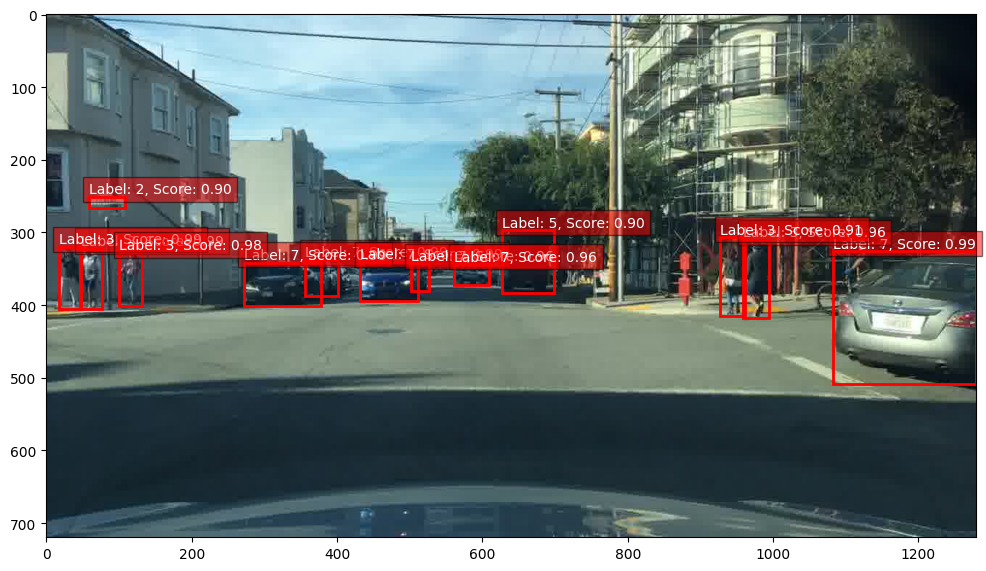

tensor([-0.2647,  0.5848, -0.4280,  ...,  0.2843, -0.6407,  0.1911],
       device='cuda:0')
Number of 0 entries in bbox_feats: 0
tensor([[0.0000, 0.0399, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],
       device='cuda:0')
Number of 0 entries in scene_feats: 1913
Number of 0 entries in scene_feats_raw: 0

=== Sample #25  —  path: ../data/BDD/data/53e3a21e-ce6743b6_3.jpg ===
[0. 0. 0. 1. 0.]
Original attr_labels: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 1. 0. 1. 0.]
global feature shape: torch.Size([1, 2048])
rois shape: torch.Size([100, 5])
scores shape: torch.Size([100])
labels shape: torch.Size([100])
bbox_feats shape: torch.Size([100, 1024])
Plotting ROIs on the image...


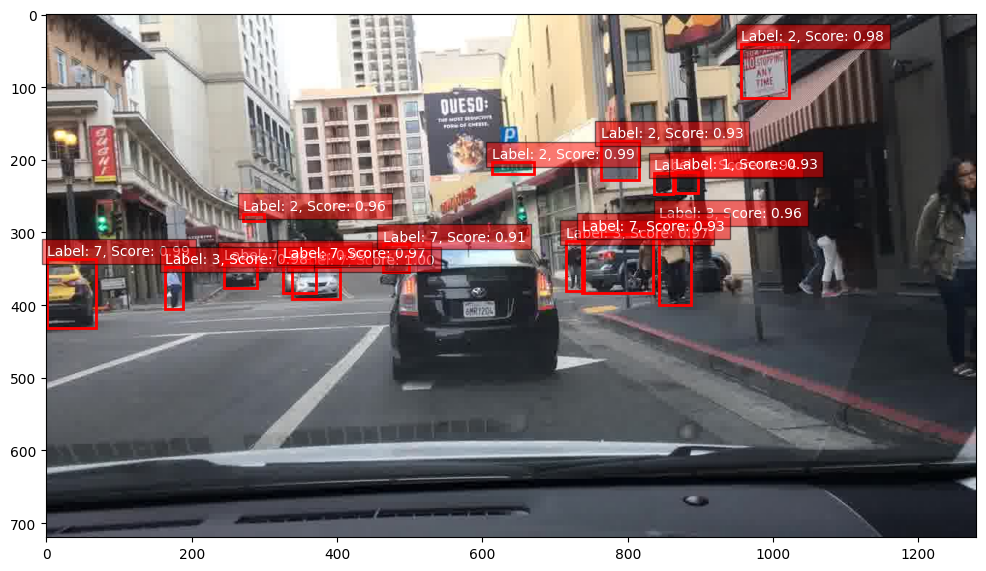

tensor([-0.0021,  0.5765,  0.0575,  ...,  0.1048, -0.1788,  0.2065],
       device='cuda:0')
Number of 0 entries in bbox_feats: 0
tensor([[0., 0., 0.,  ..., 0., 0., 0.]], device='cuda:0')
Number of 0 entries in scene_feats: 1962
Number of 0 entries in scene_feats_raw: 0

=== Sample #26  —  path: ../data/BDD/data/488480d6-e285e40b_3.jpg ===
[1. 0. 0. 1. 0.]
Original attr_labels: [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.]
global feature shape: torch.Size([1, 2048])
rois shape: torch.Size([58, 5])
scores shape: torch.Size([58])
labels shape: torch.Size([58])
bbox_feats shape: torch.Size([58, 1024])
Plotting ROIs on the image...


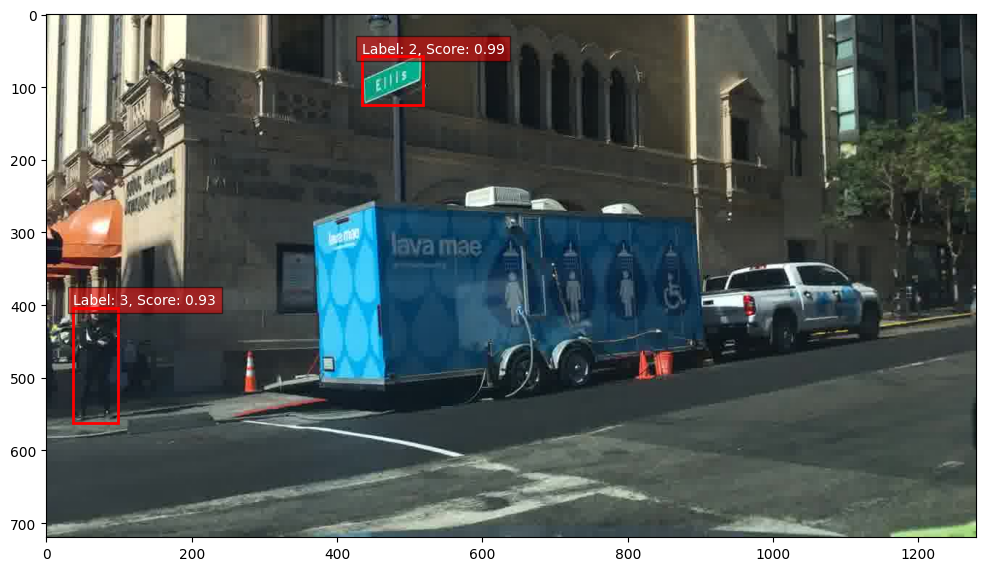

tensor([-0.1285,  0.6684,  0.1680,  ...,  0.0514, -0.2352, -0.2462],
       device='cuda:0')
Number of 0 entries in bbox_feats: 0
tensor([[0., 0., 0.,  ..., 0., 0., 0.]], device='cuda:0')
Number of 0 entries in scene_feats: 1904
Number of 0 entries in scene_feats_raw: 0

=== Sample #27  —  path: ../data/BDD/data/a5a31acc-3365626c_3.jpg ===
[0. 1. 0. 1. 0.]
Original attr_labels: [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.]
global feature shape: torch.Size([1, 2048])
rois shape: torch.Size([91, 5])
scores shape: torch.Size([91])
labels shape: torch.Size([91])
bbox_feats shape: torch.Size([91, 1024])
Plotting ROIs on the image...


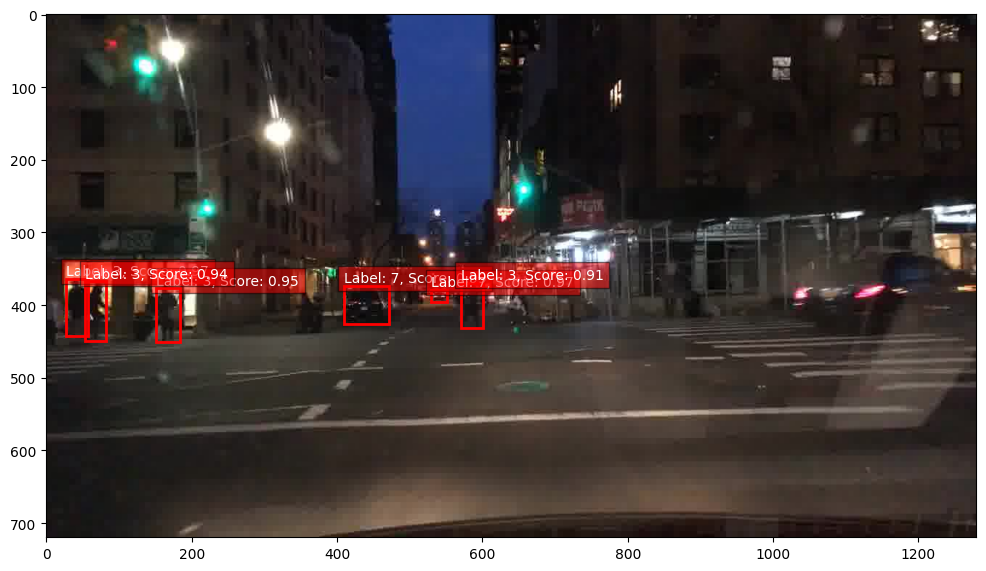

tensor([ 0.1461,  0.6637, -0.3053,  ...,  0.4451, -0.1883,  0.5483],
       device='cuda:0')
Number of 0 entries in bbox_feats: 0
tensor([[0., 0., 0.,  ..., 0., 0., 0.]], device='cuda:0')
Number of 0 entries in scene_feats: 1918
Number of 0 entries in scene_feats_raw: 0

=== Sample #28  —  path: ../data/BDD/data/39bd30d2-17a542ed_1.jpg ===
[1. 0. 0. 1. 0.]
Original attr_labels: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 0. 1. 0. 1. 0. 0.]
global feature shape: torch.Size([1, 2048])
rois shape: torch.Size([73, 5])
scores shape: torch.Size([73])
labels shape: torch.Size([73])
bbox_feats shape: torch.Size([73, 1024])
Plotting ROIs on the image...


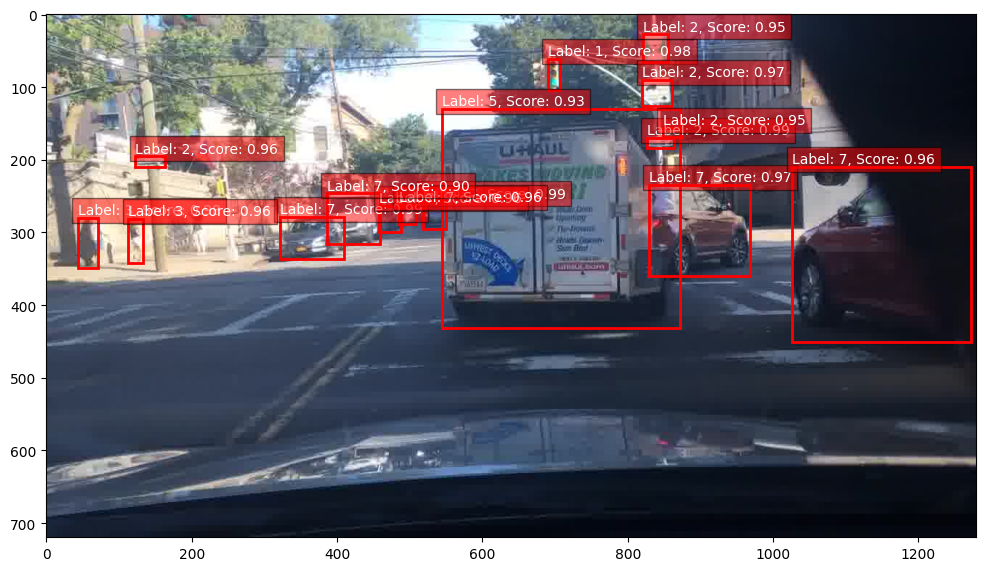

tensor([-0.0294,  0.6293, -0.1970,  ...,  0.4372, -0.4449,  0.3224],
       device='cuda:0')
Number of 0 entries in bbox_feats: 0
tensor([[0., 0., 0.,  ..., 0., 0., 0.]], device='cuda:0')
Number of 0 entries in scene_feats: 1977
Number of 0 entries in scene_feats_raw: 0

=== Sample #29  —  path: ../data/BDD/data/89f9c1f2-277d054d_1.jpg ===
[1. 0. 0. 1. 0.]
Original attr_labels: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.]
global feature shape: torch.Size([1, 2048])
rois shape: torch.Size([53, 5])
scores shape: torch.Size([53])
labels shape: torch.Size([53])
bbox_feats shape: torch.Size([53, 1024])
Plotting ROIs on the image...


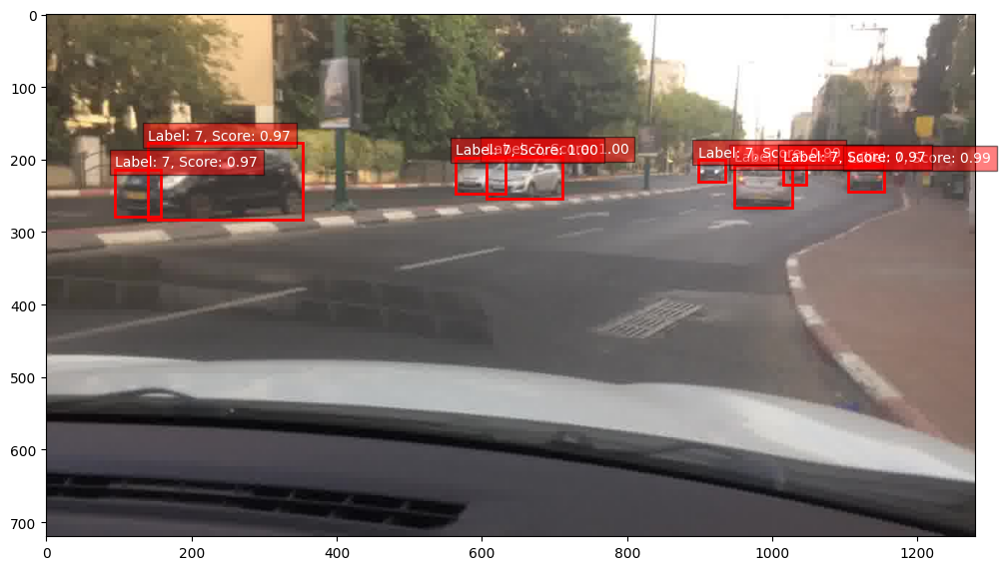

tensor([-0.0864,  0.5552, -0.2491,  ...,  0.1611, -0.5672, -0.0082],
       device='cuda:0')
Number of 0 entries in bbox_feats: 0
tensor([[0., 0., 0.,  ..., 0., 0., 0.]], device='cuda:0')
Number of 0 entries in scene_feats: 1896
Number of 0 entries in scene_feats_raw: 0

=== Sample #30  —  path: ../data/BDD/data/babd6d42-754e86fe_1.jpg ===
[0. 0. 0. 1. 0.]
Original attr_labels: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0.]
global feature shape: torch.Size([1, 2048])
rois shape: torch.Size([40, 5])
scores shape: torch.Size([40])
labels shape: torch.Size([40])
bbox_feats shape: torch.Size([40, 1024])
Plotting ROIs on the image...


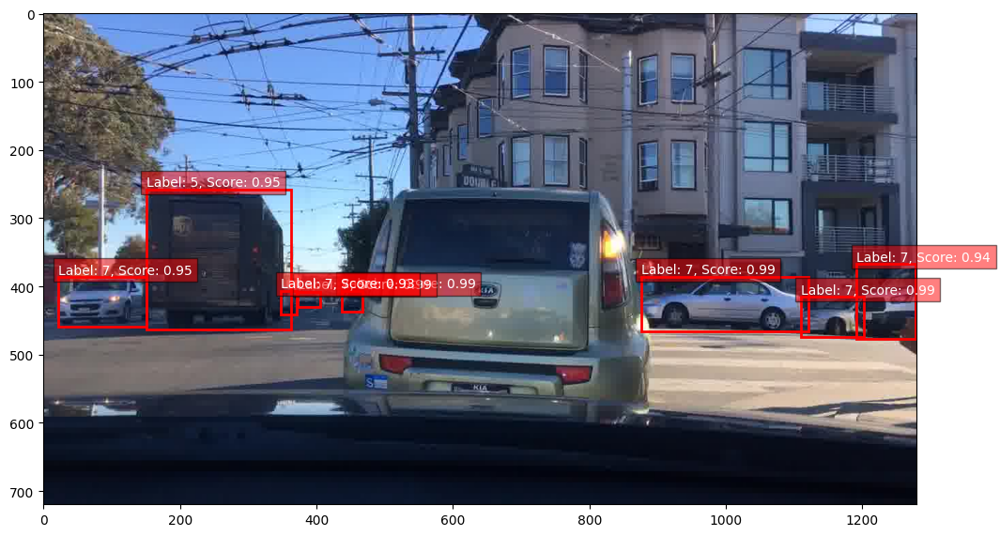

tensor([-0.0428,  0.4909, -0.0570,  ...,  0.0609, -0.1996,  0.0671],
       device='cuda:0')
Number of 0 entries in bbox_feats: 0
tensor([[0., 0., 0.,  ..., 0., 0., 0.]], device='cuda:0')
Number of 0 entries in scene_feats: 1927
Number of 0 entries in scene_feats_raw: 0


In [7]:
show_images_with_attribute(
    train_loader=train_loader,
    extractor=pretrained_model,      # or your already-initialized extractor
    attribute_index=12,            # change this to whichever of the 21 dims you want
    num_images=30,
    confidence_threshold=0.9,
    plot=True
)

In [8]:
sys.exit(0)

SystemExit: 0

/users-1/eleonora/anaconda3/envs/r4rr/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3441: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


# Feature extractor test

In [ ]:
for images, class_labels, attr_labels, img_paths in train_loader:
    images = images.to('cuda')
    scene_feats, scene_feats_raw, rois, scores, labels, bbox_feats, _ = pretrained_model(images)

    for i in range(len(images)):
        img_path = img_paths[i]
        save_emb_folder = f"FASTER-BDDOIA/train/{img_path.split('/')[-1].split('.')[0]}"
        saved_img_path = os.path.join(save_emb_folder, "embedded_image.pt")
        saved_img_emb = torch.load(saved_img_path)
        cosine_similarity = torch.nn.functional.cosine_similarity(saved_img_emb.cpu(), scene_feats[i].cpu(), dim=0)
        print(f"Cosine similarity between saved image embedding and scene_feats[{i}]: {cosine_similarity.item()}")

    print("global feature shape:", scene_feats.shape)
    print("rois shape:", rois.shape)
    print("scores shape:", scores.shape)
    print("labels shape:", labels.shape)
    print("bbox_feats shape:", bbox_feats.shape)
    
    # rois: [N, 5] -> first column is batch index
    batch_indices = rois[:, 0].long()  # [N]
    # Group everything per image
    B = images.shape[0]
    per_image = []
    for i in range(B):
        mask = (batch_indices == i)
        per_image.append({
            "rois": rois[mask][:, 1:],          # remove batch_idx column
            "scores": scores[mask],
            "labels": labels[mask],
            "features": bbox_feats[mask],       # [Ni, 1024]
            "scene_feat": scene_feats[i]        # [2048]
        })

    print("_______________________________")
    print("First image ROIs and features:")
    print("rois shape:", per_image[0]["rois"].shape)
    print("scores shape:", per_image[0]["scores"].shape)
    print("labels shape:", per_image[0]["labels"].shape)
    print("rois features shape:", per_image[0]["features"].shape)
    print("scene_feat shape:", per_image[0]["scene_feat"].shape)
    print("_______________________________")
    
    #plot_rois(images[0], per_image[0]["rois"], per_image[0]["labels"], per_image[0]["scores"], confidence_threshold=0.90)
    
    print("Second image ROIs and features:")
    print("rois shape:", per_image[1]["rois"].shape)
    print("scores shape:", per_image[1]["scores"].shape)
    print("labels shape:", per_image[1]["labels"].shape)
    print("rois features shape:", per_image[1]["features"].shape)
    print("scene_feat shape:", per_image[1]["scene_feat"].shape)
    
    #plot_rois(images[1], per_image[1]["rois"], per_image[1]["labels"], per_image[1]["scores"], confidence_threshold=0.90)

    test_1_image = images[0]
    test_1_roi = per_image[0]["rois"][0]
    test_1_result = per_image[0]["features"][0]
    
    test_2_image = images[1]
    test_2_roi = per_image[1]["rois"][1]
    test_2_result = per_image[1]["features"][1]

    break

In [ ]:
_, _, _, _, _, _, test_1_output = pretrained_model(test_1_image.unsqueeze(0), test_1_roi.unsqueeze(0))
_, _, _, _, _, _, test_2_output = pretrained_model(test_2_image.unsqueeze(0), test_2_roi.unsqueeze(0))

assert torch.allclose(test_1_output, test_1_result.unsqueeze(0), atol=1e-6), "Test 1 output does not match the expected result."
assert torch.allclose(test_2_output, test_2_result.unsqueeze(0), atol=1e-6), "Test 2 output does not match the expected result."

# Processing Inspection

In [ ]:
import torch
folder = "FASTER-BDDOIA/train/0a0eaeaf-9ad0c6dd_1"

emb_raw = torch.load(f"{folder}/embedded_image_raw.pt")
emb     = torch.load(f"{folder}/embedded_image.pt")
rois    = torch.load(f"{folder}/detected_rois.pt")  # shape [Ni,5]
labels  = torch.load(f"{folder}/detection_labels.pt")
gt_cls  = torch.load(f"{folder}/class_labels.pt")   # shape [5]

In [ ]:
print(gt_cls)
print(rois.shape)
print(rois[:,0])
print(emb_raw)
print(f"Number of 0 entries in emb_raw: {(emb_raw == 0).sum().item()}")
print(emb)
print(f"Number of 0 entries in emb: {(emb == 0).sum().item()}")

In [ ]:
for images, class_labels, attr_labels, img_paths in train_loader:
    for i, img_path in enumerate(img_paths):
        if "0a0eaeaf-9ad0c6dd_1" in img_path:
            print(f"Labels for image {img_path}: {class_labels[i]}")
            break

In [ ]:
import os
import torch

root_folder = "FASTER-BDDOIA"
subfolder_name = "03da9170-d2b4b068"
found = False

for split in ["train", "test", "val"]:
    split_path = os.path.join(root_folder, split, subfolder_name)
    if os.path.isdir(split_path):
        print(f"Found '{subfolder_name}' in '{split}' folder.")
        found = True
        attr_labels_path = os.path.join(split_path, "attr_labels.pt")
        if os.path.isfile(attr_labels_path):
            attr_labels = torch.load(attr_labels_path)
            print("attr_labels.pt contents:", attr_labels)
        else:
            print(f"'attr_labels.pt' not found in {split_path}")

if not found:
    print(f"Subfolder '{subfolder_name}' not found in train, test, or val folders.")